In [1]:
## Libraries
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

## Plot settings
plt.rc('xtick', direction='in', labelsize=14)
plt.rc('ytick', direction='in', labelsize=14)
plt.rc('axes', labelsize=20, titlesize=22)
plt.rc('legend', fontsize=14)
plt.rc('animation', html='jshtml')
plt.rcParams['font.family'] = 'DeJavu Serif'
plt.rcParams['font.serif'] = ['Computer Modern Roman']
plt.rcParams["font.size"] = "12"
plt.rcParams['mathtext.fontset'] = 'cm'

Following meeting with Anne and notes thereof we construct a toy model of the dynamics.
Start by noting that we can construct a momentum eigenvector as
\begin{equation} 
    \lvert p \rangle = \sum_{n} e^{i p n} \lvert n \rangle,
\end{equation}
Now $n \in \{ 0, 1, ..., 7\}$ while similarly $p$ is already known too. $n$ simply refers (presumably) and thus we attempt the construction.

We let $n$ denote the entry of a coordinate vector. Thus we will write $\lvert p \rangle$ in position space basis. Note that $p = \{\frac{2 \pi}{N}k \}$ where $N$ is the number of sites in the chain, and $k \in \{0, 1, ..., 7\}$.

In [2]:
# Define neccessary scalars
N = 8
ks = np.arange(1,9)
ns = np.arange(0,8)

# Define all sites vectors:
site_vecs = []
for i in ns:
    empty_vector = np.zeros(8, dtype= np.complex128)
    empty_vector[i] = 1
    site_vecs.append(empty_vector)

# Calculate ps
ps = [(2*np.pi)/(N)*k for k in ks]

# Calculate eigenvectors
p_vecs = [sum([np.exp(1j*p*n)*n_site for n, n_site in zip(ns, site_vecs)]) for p in ps]

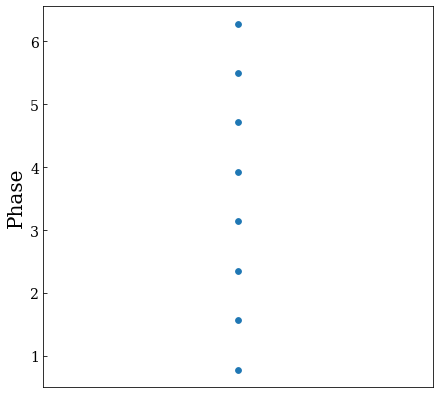

In [3]:
psfig, ax = plt.subplots(figsize= (7,7))

xs = np.zeros(8)
ys = ps

marker_size = 33

ax.scatter(x= xs, y= ys, s= marker_size)
ax.set_xticks([])
ax.set_ylabel('Phase')

plt.show()

A wavefunction $\lvert \psi \rangle$ can be written as linear combination of momentum eigenstates
\begin{equation}
    \lvert \psi \rangle = \sum_p c_p \lvert p \rangle.
\end{equation}
Now if we want to evolve them in time we simply tack on a global factor $e^{-i E_n t}$. $E_n$ we know as the energy of the BLT state we are investigating. Say we have a BLT state with momentum $p$ then we take the energy $E_n$ of the BLT state and use it as factor.
Thus to do a time evolution on our toy model, we need to know BLT state's $p$, $E_n$, and $c_p$ i.e. coefficient in the linear combination before time evolution.

In [4]:
ps

[0.7853981633974483,
 1.5707963267948966,
 2.356194490192345,
 3.141592653589793,
 3.9269908169872414,
 4.71238898038469,
 5.497787143782138,
 6.283185307179586]

In [10]:
# This is the energy of the BLT states
Ens = [2.1414537901321973, 2.153785797564261, 2.163135186056102]
# This is the phases of the BLT states
phases = [1.5707963267948966, 3.926990816987241, 0.7853981633974483]
# From the last part we may write
group = [1, 4, 0]

# We start out by assuming cp = 1 for all p and thus equally parts of linear combination
# Now define the time evolution function
def time_evolve_evec(group_of_states, time, vec, eval):

    hbar = 1
    t = time

    # Make the group of states in to vectors and multiply with time op
    phis = [np.exp(-1j*(En/hbar)*t)*vec[i] for i, En in zip(group_of_states, eval)]

    # Make a linear combination equally divided
    a = len(phis)
    psi = sum([(1/a)*x for x in phis])

    phi_norm = psi / (np.sqrt(np.vdot(psi,psi)))

    density_of_states = [(x.conj() * x).real for x in phi_norm]
    
    return phi_norm, density_of_states

In [11]:
# Construct the chain
# First needed functions
def rotation(phi):
    operator = np.array([[np.cos(phi), -np.sin(phi)],[np.sin(phi), np.cos(phi)]])
    return operator

def jump_finder(input_list, ref_dist):
    # Define empty possible jumps
    total_jumps = []
    jump_indices = []
    for i in input_list:
        # Calculate every jump for every point
        jumps = [x for x in input_list if  ref_dist - 1*10**(-6) < np.linalg.norm( np.array(i) - np.array(x) ) < ref_dist + 1*10**(-6)]
        # Find index of site to which we may jump
        indices = [j for j in range(len(input_list)) for y in jumps if input_list[j][0] == y[0] and input_list[j][1] == y[1]]
        # Append to main lists
        total_jumps.append(jumps)
        jump_indices.append(indices)
    return total_jumps, jump_indices


ref_point = np.array([1,0])
ks = np.arange(0,8)
points = [np.matmul(rotation((np.pi/180)*45*k), ref_point) for k in ks]

# Create jump coordinates by referencing a length
reference_dist = np.linalg.norm(points[0] - points[1])
jump_coors, jump_indices = jump_finder(points, reference_dist)


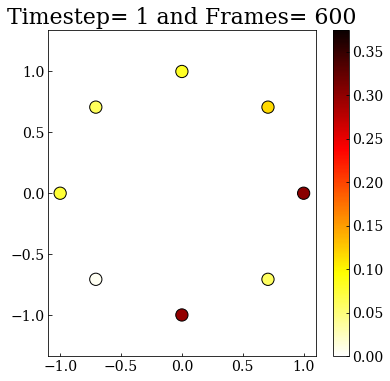

In [12]:
## Magic line for animation
%matplotlib inline
# Attempt at animating time evolution

# Set figure up first
fig, ax = plt.subplots(figsize=(6,6))
# Set bascis
sites = ax.scatter(x=[], y=[], c=[])

xs = [w[0] for w in points]
ys = [w[1] for w in points]


# Set timesteps, state of choice for animation, and number of frames
#timestep = 0.1
timestep = 1
n_frames = 600

group_of_choice =  group

psi_0, dos_0 = time_evolve_evec(group_of_choice, 0, p_vecs, Ens)

dos_max = max(dos_0)

#dos_max = 1

#plt.set_cmap('binary')
plt.set_cmap('hot_r')
#cax = ax.scatter(x= xs, y= ys, s= marker_size, c= dos_max, zorder= 2)
marker_size = 150

# This function will do the animating
def update(i):
    plt.clf()
    # t is the steps we progress, timestep sets the steplength
    t = i * timestep

    # Using the time evolution to find density of states for each increment
    psi, dos = time_evolve_evec(group_of_choice, t, p_vecs, Ens)
    cf = plt.scatter(x= xs, y= ys, c= dos, edgecolors= 'k', s= marker_size, vmin=0, vmax= dos_max)
    plt.colorbar(cf)
    plt.title(f'Timestep= {timestep} and Frames= {n_frames}')
    #plt.legend(loc= 3)
    plt.axis('equal')


anim = FuncAnimation(fig, update, frames= n_frames, interval=250)

kname = '_'+''.join([str(ele) + '_' for ele in group_of_choice])

anim.save(f'AB_BLT_time_evolve/k=' + kname + '.gif', writer='imagemagick', fps=30)

anim